In [131]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from google.colab import drive
import plotly.express as px

In [132]:
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [133]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/netflix.data.csv')

In [134]:
df.head()

,title,type,genres,releaseYear,imdbId,imdbAverageRating,imdbNumVotes,availableCountries
0,Forrest Gump,movie,"Drama, Romance",1994.0,tt0109830,8.8,2317634.0,MX
1,The Fifth Element,movie,"Action, Adventure, Sci-Fi",1997.0,tt0119116,7.6,517328.0,"AT, CH, DE"
2,Kill Bill: Vol. 1,movie,"Action, Crime, Thriller",2003.0,tt0266697,8.2,1222329.0,"AE, AL, AO, AT, AU, AZ, BG, BH, BY, CA, CI, CM..."
3,Jarhead,movie,"Biography, Drama, War",2005.0,tt0418763,7.0,211645.0,"AD, AE, AG, AL, AO, AT, AZ, BA, BG, BH, BM, BR..."
4,Unforgiven,movie,"Drama, Western",1992.0,tt0105695,8.2,443986.0,"AU, BA, BG, CZ, HR, HU, MD, ME, MK, NZ, PL, RO..."


In [135]:
df = df[~(df['title'].isna())]



In [136]:
df.dropna(inplace=True)

In [137]:
df.type = df.type.astype('category')

In [138]:
df.loc[df['genres'].str.contains('Documentary'),'genres'] = 'Documentary'

## We can see the most popular 10 genres netflix keeps in their library.

In [139]:
df.genres.value_counts().head(10)

,count
genres,
Documentary,1830
Comedy,1597
Drama,1515
"Comedy, Drama",764
"Drama, Romance",642
"Comedy, Romance",638
"Comedy, Drama, Romance",611
"Action, Adventure, Animation",525
"Action, Crime, Drama",394


# Looks like Documentary is the most popular genre.

In [140]:
three_gen_index = df[df['genres'].str.count(',') >= 2].index

In [141]:

df.loc[three_gen_index, 'genres'] = df.loc[three_gen_index, 'genres'].str.split(',').apply(lambda x: x[0] + ',' + x[1] if len(x) > 1 else x[0])



In [142]:
df['genres'] = df['genres'].str.split(',').apply(lambda x: ','.join(sorted([genre.strip().upper() for genre in x])))

In [143]:
df['releaseYear'] = df['releaseYear'].astype('int')

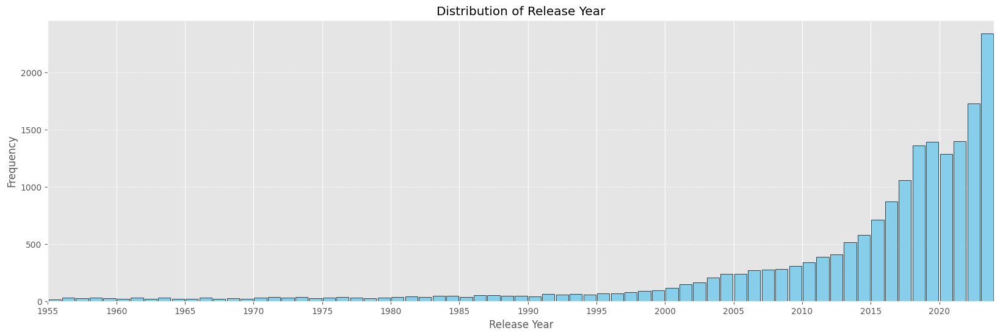

In [144]:
start_year = 1915
end_year = 2024
bin_width = 1  # Each bin represents one year

# Plotting the histogram
plt.figure(figsize=(20, 6))
df['releaseYear'].plot(kind='hist', bins=np.arange(start_year, end_year + bin_width, bin_width), rwidth=0.9, color="skyblue", edgecolor="black")
plt.title('Distribution of Release Year')
plt.xlabel('Release Year')
plt.ylabel('Frequency')
# Set ticks at the start of each bin
plt.xticks(np.arange(start_year, end_year + bin_width, 5))  # You can change the step to fit your needs

plt.grid(axis='y', linestyle='--', alpha=0.7)  # Adding a light grid for readability
plt.xlim(1955, end_year)
plt.show()

#The plot illustrates the distribution of release years for movies and TV shows available on Netflix. A significant increase in the frequency of releases is evident starting around the early 2000s, with the most notable surge occurring in the last decade. This trend reflects the growing availability of more recent productions on the platform, likely driven by the expansion of Netflix's content library and the rise of streaming services. In contrast, productions from before the 2000s, and especially prior to 1980, are far less represented, indicating a focus on modern content over older releases.

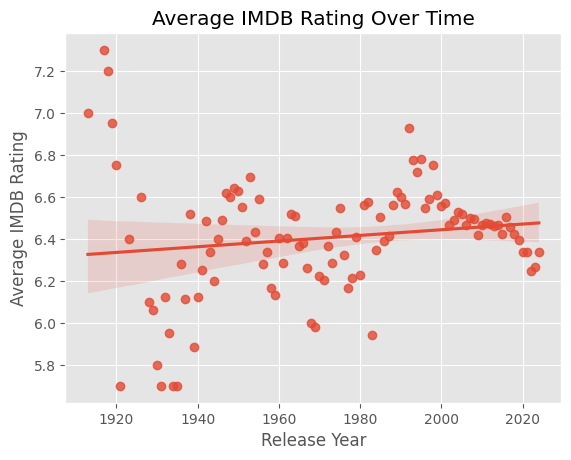

In [145]:
df.sort_values(by='releaseYear', inplace=True)
df_mean = df.groupby('releaseYear')['imdbAverageRating'].mean().reset_index()
sns.regplot(data=df_mean, x='releaseYear', y='imdbAverageRating')
plt.title('Average IMDB Rating Over Time')
plt.xlabel('Release Year')
plt.ylabel('Average IMDB Rating')
plt.show()


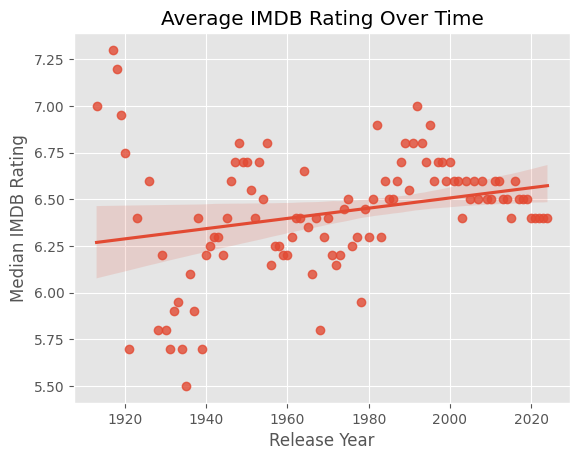

In [146]:
df.sort_values(by='releaseYear', inplace=True)
df_mean = df.groupby('releaseYear')['imdbAverageRating'].median().reset_index()
sns.regplot(data=df_mean, x='releaseYear', y='imdbAverageRating')
plt.title('Average IMDB Rating Over Time')
plt.xlabel('Release Year')
plt.ylabel('Median IMDB Rating')
plt.show()

# It might be Netflix's preference, but the average and median IMDb scores appear to stabilize around the 6.5–6.3 range over the years. This stabilization can be explained by the Central Limit Theorem, considering the significant increase in the number of titles added in recent years.

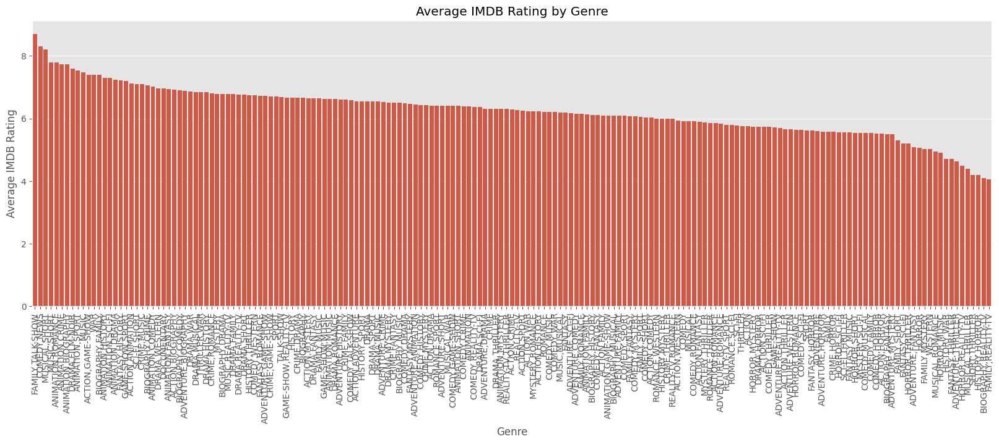

In [147]:
plt.figure(figsize=(20, 6))
sns.barplot(x='genres', y='imdbAverageRating',data = df.groupby('genres').imdbAverageRating.mean().sort_values(ascending=False).reset_index())
plt.xticks(rotation=90)
plt.title('Average IMDB Rating by Genre')
plt.xlabel('Genre')
plt.ylabel('Average IMDB Rating')
plt.show()

# It seems that Netflix has done a great job of diversifying its content. While most genres stay around the average, some genres remain well above the average, while others fall significantly below. Let's see if those that are below the average are less viewed, and if those with higher scores are watched more

In [148]:
df_year_genre = df.groupby(['releaseYear' , 'genres']).imdbAverageRating.mean().reset_index().sort_values(by='releaseYear')
df_year_genre = df_year_genre[df_year_genre['releaseYear'] >= 1980].sort_values(by=['releaseYear', 'imdbAverageRating'], ascending=[True, False])
df_year_genre

,releaseYear,genres,imdbAverageRating
588,1980,"CRIME,DRAMA",7.633333
580,1980,"ADVENTURE,ANIMATION",7.200000
583,1980,"ANIMATION,FAMILY",6.900000
584,1980,"BIOGRAPHY,DRAMA",6.800000
589,1980,DOCUMENTARY,6.500000
...,...,...,...
2700,2024,"COMEDY,HORROR",4.983333
2668,2024,ACTION,4.500000
2724,2024,FAMILY,4.433333
2697,2024,"COMEDY,FAMILY",4.350000


In [149]:
df_year_top3= df_year_genre.groupby('releaseYear').head(3).sort_values(by='releaseYear')


In [150]:
import plotly.express as px

# Create the interactive scatter plot
fig = px.scatter(
    df_year_top3,
    x="genres",
    y="releaseYear",
    color="genres",
    size="imdbAverageRating",
    title="Top 3 Average IMDB Rating by Genre Over Time",
    labels={"releaseYear": "Release Year", "imdbAverageRating": "Average IMDB Rating"},
    hover_name="genres"  # This will show the genre when hovering
)

# Update the layout to add grid lines every 5 years
fig.update_yaxes(
    tick0=1980,
    dtick=5,
    title="Release Year",
    gridcolor="lightgray",
    showgrid=True,
)

# Update the x-axis labels for readability
fig.update_xaxes(title="Genres")

fig.update_layout(
    legend_title="Genre"
    ,height=1200,
    width=1200
)

# Show the figure
fig.show()

In [151]:

df_year_least3= df_year_genre.groupby('releaseYear').tail(3).sort_values(by='releaseYear')


In [152]:
fig = px.scatter(
    df_year_least3,
    x="genres",
    y="releaseYear",
    color="genres",
    size="imdbAverageRating",
    title="Least IMDB Rating by Genre Over Time",
    labels={"releaseYear": "Release Year", "imdbAverageRating": "Average IMDB Rating"},
    hover_name="genres"  # This will show the genre when hovering
)

# Update the layout to add grid lines every 5 years
fig.update_yaxes(
    tick0=1980,
    dtick=5,
    title="Release Year",
    gridcolor="lightgray",
    showgrid=True,
)

# Update the x-axis labels for readability
fig.update_xaxes(title="Genres")

fig.update_layout(
    legend_title="Genre"
    ,height=1200,
    width=1200
)

# Show the figure
fig.show()

# When we look at the top three best and worst genres of each year, we see significant changes every year. It also seems that the most popular genres of the previous year don't make it into the top three in the following year.

In [153]:
df[(df['type']=='movie') & (df['imdbNumVotes']>10000)].sort_values(by='imdbAverageRating', ascending=False).head(20)

,title,type,genres,releaseYear,imdbId,imdbAverageRating,imdbNumVotes,availableCountries
70,The Shawshank Redemption,movie,DRAMA,1994,tt0111161,9.3,2961822.0,"AD, BA, BE, BG, CA, CV, CZ, ES, HR, HU, IN, MD..."
66,The Godfather,movie,"CRIME,DRAMA",1972,tt0068646,9.2,2065001.0,"AD, AE, AG, AL, AO, AR, AT, AU, BA, BB, BE, BG..."
51,The Dark Knight,movie,"ACTION,CRIME",2008,tt0468569,9.0,2943222.0,"AD, AT, AU, BA, BG, CA, CH, CZ, DE, DK, ES, FI..."
42,The Lord of the Rings: The Return of the King,movie,"ACTION,ADVENTURE",2003,tt0167260,9.0,2027365.0,"AU, CH, IN, IT, KR, NZ, SM"
67,The Godfather Part II,movie,"CRIME,DRAMA",1974,tt0071562,9.0,1394549.0,"AO, CI, CM, CV, GH, GQ, KE, MG, ML, MU, MZ, NE..."
160,Pulp Fiction,movie,"CRIME,DRAMA",1994,tt0110912,8.9,2274202.0,"AD, AE, AG, AL, AO, AR, AU, AZ, BA, BB, BE, BG..."
40,The Lord of the Rings: The Fellowship of the Ring,movie,"ACTION,ADVENTURE",2001,tt0120737,8.9,2057193.0,"AU, CH, IN, IT, KR, NZ, SM"
11038,David Attenborough: A Life on Our Planet,movie,DOCUMENTARY,2020,tt11989890,8.9,34981.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE..."
0,Forrest Gump,movie,"DRAMA,ROMANCE",1994,tt0109830,8.8,2317634.0,MX
14815,12th Fail,movie,"BIOGRAPHY,DRAMA",2023,tt23849204,8.8,133326.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE..."


In [154]:
df[(df['type']=='tv') & (df['imdbNumVotes']>10000)].sort_values(by='imdbAverageRating', ascending=False).head(20)

,title,type,genres,releaseYear,imdbId,imdbAverageRating,imdbNumVotes,availableCountries
15515,Breaking Bad,tv,"CRIME,DRAMA",2008,tt0903747,9.5,2231367.0,"AD, AE, AG, AL, AO, AR, AT, AZ, BA, BB, BE, BG..."
15587,Band of Brothers,tv,"DRAMA,HISTORY",2001,tt0185906,9.4,544413.0,"AG, AR, BA, BB, BG, BM, BO, BR, BS, BZ, CL, CO..."
15489,Avatar: The Last Airbender,tv,"ACTION,ADVENTURE",2005,tt0417299,9.3,388503.0,"AD, AE, AG, AO, AR, AT, AU, BB, BE, BH, BM, BO..."
17076,Our Planet,tv,DOCUMENTARY,2019,tt9253866,9.2,53202.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE..."
16027,The Chosen,tv,"DRAMA,HISTORY",2017,tt9471404,9.2,50983.0,"AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BG, BH..."
16881,The Last Dance,tv,DOCUMENTARY,2020,tt8420184,9.1,158847.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE..."
16774,My Mister,tv,"DRAMA,FAMILY",2018,tt7923710,9.1,10533.0,"AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BG, BH..."
15671,Sherlock,tv,"CRIME,DRAMA",2010,tt1475582,9.1,1023497.0,"AL, AO, AT, AZ, BA, BE, BG, BY, CH, CI, CM, CV..."
15525,Attack on Titan,tv,"ACTION,ADVENTURE",2013,tt2560140,9.1,559034.0,"ES, FR, GF, HK, ID, IT, JP, KR, MY, PH, PT, SG..."
16155,Rick and Morty,tv,"ADVENTURE,ANIMATION",2013,tt2861424,9.1,625804.0,"AE, AO, AT, AU, BH, CH, CI, CM, CV, DE, DZ, EE..."


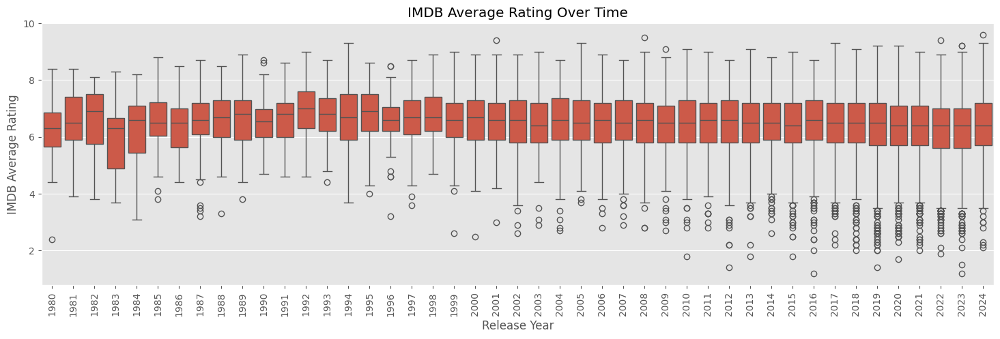

In [155]:
df_1980_2024 = df[(df['releaseYear']>=1980)]
plt.figure(figsize=(18,5))
sns.boxplot(x='releaseYear', y='imdbAverageRating', data=df_1980_2024)
plt.title('IMDB Average Rating Over Time')
plt.xlabel('Release Year')
plt.ylabel('IMDB Average Rating')
plt.xticks(rotation=90)
plt.show()

# Although the average hasn't changed much in recent years, we can say that there are extremely poor productions compared to earlier times.

In [156]:
genres_top_30 = df.genres.value_counts()[:30].index.to_list()

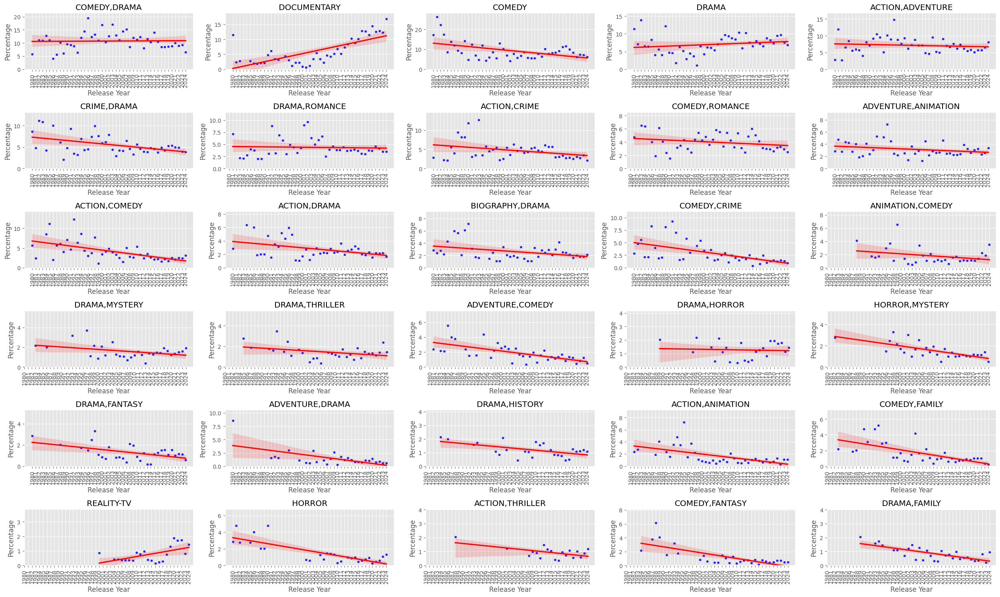

In [157]:
plt.style.use('ggplot')
fig, ax = plt.subplots(ncols=5, nrows=6, figsize=(25, 15))  # Adjust height to fit plots better
ax = ax.flatten()  # Flatten to index subplots easily

for i in range(len(genres_top_30)):  # Use len(genres_top_30) to avoid index errors
    genre_data = (
        (df_1980_2024[df_1980_2024['genres'] == genres_top_30[i]]
         .groupby('releaseYear').size() / df_1980_2024.groupby('releaseYear').size()) * 100
    ).reset_index()

    genre_data.rename(columns={0: 'Percentage'}, inplace=True)  # Rename column for clarity

    # Plot on specific axes
    sns.regplot(
        x='releaseYear',
        y='Percentage',
        ax=ax[i],
        color='blue',
        data=genre_data,
        scatter_kws={'s': 10},  # Reduce marker size
        line_kws={'color': 'red'}
    )
    ax[i].set_ylim(0, genre_data['Percentage'].max()+2)  # Use correct column name and invoke .max()
    ax[i].set_xticks(range(1980,2025))
    ax[i].tick_params(axis='x', rotation=90)
    ax[i].set_title(genres_top_30[i])
    ax[i].set_xlabel('Release Year')
    ax[i].set_ylabel('Percentage')

# Remove empty subplots if genres_top_30 has fewer than 30 items
for j in range(len(genres_top_30), len(ax)):
    fig.delaxes(ax[j])

plt.tight_layout()
plt.show()


# This is so interesting! This plot series reveals that some genres show a dramatic increase over the years compared to others. I want to draw your attention to the significant growth in the Documentary and Reality-TV genres.

# Reality-TV, as a genre, is relatively new compared to others. However, it has shown remarkable growth since the 2000s. The reasons behind this trend are worth investigating. Could it be due to the lower production costs, or is it driven by high demand? If demand is indeed the key factor, this raises another research question: Why is Reality-TV surpassing much higher-quality and more immersive productions?

# Documentary films have also been growing rapidly, especially after 2000, with platforms like Netflix continuing to feature them prominently in their libraries. This trend raises some intriguing questions: Have we made more discoveries after 2000 that warrant documentary storytelling? Or has technology advanced to a point where producing high-quality documentaries has become more accessible? Alternatively, could this surge be driven by a significantly increased demand for the documentary genre?

# Commenting on decreasing genres is not easy, as it seems to be a common trend across almost all genres. One significant reason for this could be the emergence of new and diverse genres every year, which naturally shifts audience interest and dilutes the popularity of older ones.


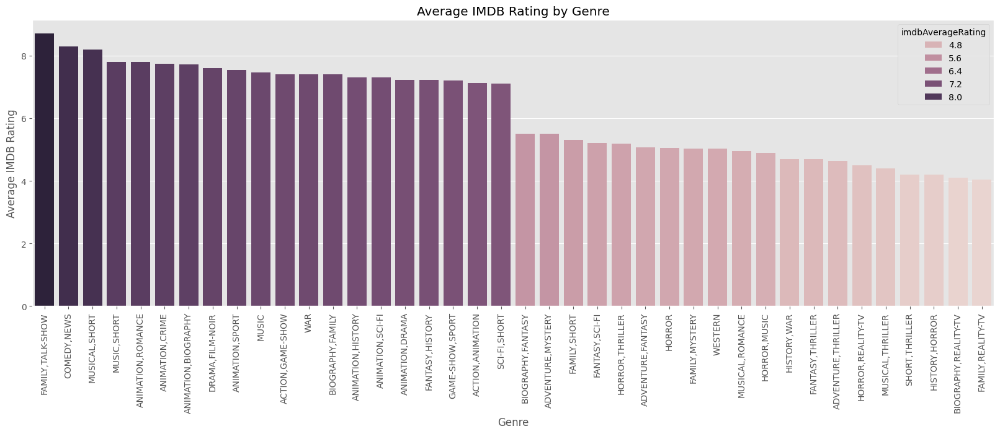

In [158]:
plt.figure(figsize=(20, 6))
data = pd.concat([df.groupby('genres').imdbAverageRating.mean().sort_values(ascending=False).reset_index().head(20),df.groupby('genres').imdbAverageRating.mean().sort_values(ascending=False).reset_index().tail(20)]
)
sns.barplot(x='genres', y='imdbAverageRating',data = data, hue='imdbAverageRating')
plt.xticks(rotation=90)
plt.title('Average IMDB Rating by Genre')
plt.xlabel('Genre')
plt.ylabel('Average IMDB Rating')
plt.show()

# This bar plot displays the top 20 and least 20 genres of all time that Netflix maintains in its library. Interestingly, while the Reality-TV genre has been increasing in quantity over the years, it is also one of the most common genres found among the least 20 genres, along with Thriller. This paradox suggests that while Reality-TV is growing in overall popularity, a significant portion of it might not perform as well in terms of engagement or audience retention.


In [159]:
df['total_countries'] = df['availableCountries'].str.split(',').apply(lambda x: len(x))
df.head(1)

,title,type,genres,releaseYear,imdbId,imdbAverageRating,imdbNumVotes,availableCountries,total_countries
4595,Ingeborg Holm,movie,DRAMA,1913,tt0003014,7.0,1478.0,"AT, BE, BG, BM, CH, CZ, DE, EE, ES, FR, GB, GF...",29


In [160]:
df.sort_values('total_countries', ascending=False)

,title,type,genres,releaseYear,imdbId,imdbAverageRating,imdbNumVotes,availableCountries,total_countries
12016,Intrusion,movie,"ACTION,DRAMA",2021,tt5563324,5.3,22039.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE...",131
6356,Day Shift,movie,"ACTION,COMEDY",2022,tt13314558,6.1,93012.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE...",131
11802,Blood Red Sky,movie,"ACTION,DRAMA",2021,tt6402468,6.1,56446.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE...",131
11825,Damsel,movie,"ACTION,ADVENTURE",2024,tt13452446,6.1,101247.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE...",131
18422,Ganglands,tv,"ACTION,CRIME",2021,tt13278100,7.2,4679.0,"AD, AE, AG, AL, AO, AR, AT, AU, AZ, BA, BB, BE...",131
...,...,...,...,...,...,...,...,...,...
5008,Plum Blossom,movie,"DRAMA,ROMANCE",2000,tt0266855,5.9,356.0,KR,1
18929,Love Class,tv,ROMANCE,2022,tt19800744,7.1,501.0,KR,1
18904,Master of My Own,tv,"DRAMA,ROMANCE",2022,tt14597982,7.6,181.0,TW,1
3533,The Iceman,movie,"BIOGRAPHY,CRIME",2012,tt1491044,6.8,80923.0,CA,1


In [161]:
available_countries = df['availableCountries'].str.split(', ').apply(lambda x: [s.strip() for s in x]).explode().value_counts()
available_countries.index

Index(['SK', 'BG', 'SI', 'LV', 'IS', 'LT', 'GB', 'ES', 'PT', 'RO',
       ...
       'CU', 'GQ', 'SA', 'SM', 'YE', 'OM', 'HR', 'IL', 'UA', 'TD'],
      dtype='object', name='availableCountries', length=131)

In [162]:
countries = ','.join(available_countries.index.to_list()).replace(' ','').split(',')
print(len(countries))
print(len(set(countries)))


131
131


In [163]:


from openai import OpenAI
import re




client = OpenAI(api_key='---')


model = 'gpt-4o'

instructions = """You will receive a Python list of country abbreviations. Your task is to return the full country names corresponding to each abbreviation, in the same order as they appear in the list.
The country names should be written using only English alphabet letters. output format should contain only full name in country_name_1,country_name_2 ...,country_name_n format"""

def get_comtpetion(prompt, model=model, instruction=instructions):
    message=[{'role':'system', 'content':instruction},
             {'role':'user', 'content':prompt}]
    response=client.chat.completions.create(
        model=model,
        messages=message,
        temperature = 1,

    )
    return response.choices[0].message.content





text_dict = get_comtpetion(f"Here are the country abbrevations for you: {countries}")
text_dict


'Slovakia,Bulgaria,Slovenia,Latvia,Iceland,Lithuania,United Kingdom,Spain,Portugal,Romania,Germany,Italy,Austria,Estonia,Liechtenstein,Greece,Ireland,Sweden,Switzerland,Philippines,France,Belgium,Thailand,Netherlands,Norway,Malta,Luxembourg,Poland,Singapore,Australia,Czech Republic,Gibraltar,New Zealand,Bermuda,Japan,Indonesia,Denmark,Guernsey,South Korea,Canada,Hungary,Taiwan,United States,Saint Lucia,Turks and Caicos Islands,Jamaica,Brazil,Serbia,Antigua and Barbuda,Bosnia and Herzegovina,North Macedonia,Mexico,India,Belize,Albania,Bahamas,Uruguay,Costa Rica,Algeria,Montenegro,Cyprus,Chile,South Africa,Guatemala,Peru,Monaco,Dominican Republic,Paraguay,Fiji,Bolivia,Lebanon,Pakistan,Jordan,Egypt,Qatar,Kuwait,Trinidad and Tobago,United Arab Emirates,Venezuela,Ecuador,Argentina,Tanzania,Cape Verde,Ghana,Ivory Coast,Senegal,Mozambique,Nigeria,Colombia,Hong Kong,Mauritius,El Salvador,Panama,Palestine,Bahrain,French Guiana,Turkey,Honduras,Malaysia,Angola,Zimbabwe,Zambia,Kenya,Azerbaijan,Bar

In [164]:
available_countries.index = text_dict.split(',')
available_countries = available_countries.reset_index()
available_countries.rename(columns={'index':'country_name', 'availableCountries':'count'}, inplace=True)



In [165]:
available_countries[available_countries['country_name']=='Germany']


,country_name,count
10,Germany,7841


In [166]:
available_countries.sort_values('count', ascending=False).head(10)

,country_name,count
0,Slovakia,8441
1,Bulgaria,8292
2,Slovenia,8259
3,Latvia,8257
4,Iceland,8177
5,Lithuania,8138
6,United Kingdom,7942
7,Spain,7917
8,Portugal,7887
9,Romania,7860


#The countries where Netflix has produced the most content.

In [167]:
available_countries.sort_values('count', ascending=False).tail(10)

,country_name,count
121,Cuba,5841
122,Equatorial Guinea,5811
123,Saudi Arabia,5773
124,San Marino,5734
125,Yemen,5672
126,Oman,5641
127,Croatia,5633
128,Israel,5481
129,Ukraine,3449
130,Chad,761


#The countries where Netflix has produced the least content.

In [168]:

fig = px.choropleth(
    available_countries,
    locations="country_name",
    locationmode="country names",
    color="count",
    hover_name="country_name",
    color_continuous_scale=px.colors.sequential.Plasma,
    title="Number of Netflix Titles Available per Country",
    labels={"count": "Number of Titles"},
)

fig.update_layout(
    height=600,
    width=1000
)

fig.show()

# We can see that Netflix has a presence in nearly every corner of the world. However, Russia is notably absent from the map, likely due to recent political issues. Similarly, China appears to be another significant market that Netflix has yet to penetrate.

#Interestingly, Netflix offers more content in Europe compared to other regions. Surprisingly, the United States is not the country with the highest amount of content. This could be attributed to the presence of many other competing streaming platforms like Hulu and HBO, which dominate the U.S. market, potentially limiting Netflix’s content offerings in the region.

# We can also observe that Africa and the Middle East have slightly darker colors compared to other regions. This might be due to cultural conservatism, which could limit the availability or demand for certain types of content in these regions.

In [169]:
df.head(1)

,title,type,genres,releaseYear,imdbId,imdbAverageRating,imdbNumVotes,availableCountries,total_countries
4595,Ingeborg Holm,movie,DRAMA,1913,tt0003014,7.0,1478.0,"AT, BE, BG, BM, CH, CZ, DE, EE, ES, FR, GB, GF...",29


In [170]:
for c in countries:

  df[c] = df['availableCountries'].apply(lambda x: 1 if c in x else 0)



In [171]:
df.head()

,title,type,genres,releaseYear,imdbId,imdbAverageRating,imdbNumVotes,availableCountries,total_countries,SK,...,CU,GQ,SA,SM,YE,OM,HR,IL,UA,TD
4595,Ingeborg Holm,movie,DRAMA,1913,tt0003014,7.0,1478.0,"AT, BE, BG, BM, CH, CZ, DE, EE, ES, FR, GB, GF...",29,1,...,0,0,0,0,0,0,1,0,0,0
4175,A Man There Was,movie,"DRAMA,WAR",1917,tt0008663,7.3,2394.0,"AT, BE, BG, BM, CH, CY, CZ, DE, EE, ES, FR, GB...",32,1,...,0,0,0,0,0,0,1,0,0,0
3575,The Outlaw and His Wife,movie,DRAMA,1918,tt0008879,7.2,2142.0,"AT, BE, BG, BM, CH, CY, CZ, DE, EE, ES, FR, GB...",34,1,...,0,0,0,0,0,0,1,0,0,0
1803,Sir Arne's Treasure,movie,"DRAMA,HISTORY",1919,tt0010247,7.1,1596.0,"AT, BE, BG, BM, CH, CY, CZ, DE, EE, ES, FR, GB...",34,1,...,0,0,0,0,0,0,1,0,0,0
4609,Sången om den eldröda blomman,movie,"DRAMA,ROMANCE",1919,tt0010755,6.8,297.0,"AT, BE, BG, CH, CY, CZ, DE, EE, ES, FR, GB, GF...",31,1,...,0,0,0,0,0,0,1,0,0,0


In [172]:
new_columns = list(df.columns[:9]) + list(available_countries['country_name'])
df.columns = new_columns

In [173]:
df_melted = pd.melt(df.drop(columns='total_countries'), id_vars='releaseYear', var_name='country', value_name='count')


df_melted = df_melted[df_melted['count'] == 1]


fig = px.scatter(
    df_melted,
    x='releaseYear',
    y='country',
    color='country',
    title='Countries and Years Relation',
    labels={'releaseYear': 'Release Year', 'country': 'Country'}
)


fig.update_layout(
    height=600,
    width=1000
)

fig.show()

# When we examine the plot, we can see that there is no significant difference between countries in terms of movies and TV shows being released on Netflix over the last 20 years. However, a notable difference is evident between countries for productions released before 1970.